## Catalog of LSB objects around Fornax for proposal

I'm trying to find a region of size $15' \times 10'$ (orienation doesn't matter) that contains a significant number of LSB (low surface brightness) objects.


In [175]:
# Import stuff
import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt
from astropy.io import fits
import skymapper as skm
from code.plot_utils import plot_pretty
from astropy import units as u
from astropy.coordinates import SkyCoord

%matplotlib inline
%pylab inline 
plot_pretty()

Populating the interactive namespace from numpy and matplotlib


#### Import the DES catalogue

In [176]:
DES = fits.open('For_proposal_mun_2.fits')
print DES[1].header.keys

<bound method Header.keys of XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  108 / length of dimension 1                          
NAXIS2  =               345648 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   24 / number of table fields                         
TTYPE1  = 'coadd_object_id'                                                     
TFORM1  = 'K       '                                                            
TTYPE2  = 'ra      '                                                            
TFORM2  = 'D       '                                                            

##### Import and make some preliminary cuts

Let's import the DES data and make the following preliminary cuts:

\begin{equation}
spread\_model\_i + (5/3)spreaderr\_model\_i > 0.007
\end{equation}

For star-galaxy separation (keep only galaxies)

In [177]:
# Import the data first
# =================================================================
# =================================================================

#spread model i and spreaderr model i
spread_model_i = DES[1].data['spread_model_i']
speraderr_model_i = DES[1].data['spreaderr_model_i']

# Coadd_id 
COADD = DES[1].data['coadd_object_id']

#RA and DEC  of every object
RA = DES[1].data['ra']
DEC = DES[1].data['dec']

# Auto magnitudes
MAG_AUTO_G = DES[1].data['mag_auto_g']
MAG_AUTO_R = DES[1].data['mag_auto_r']
MAG_AUTO_I = DES[1].data['mag_auto_i']

# Flux radii (pixels)
FLUX_RADIUS_G = DES[1].data['flux_radius_g']
FLUX_RADIUS_R = DES[1].data['flux_radius_r']
FLUX_RADIUS_I = DES[1].data['flux_radius_i'] 

# Kron radius
KRON_RAD = DES[1].data['kron_radius']

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G = DES[1].data['mu_eff_model_g']
MU_EFF_R = DES[1].data['mu_eff_model_r']
MU_EFF_I = DES[1].data['mu_eff_model_i']

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G = DES[1].data['mu_max_g']
MU_MAX_R = DES[1].data['mu_max_r']
MU_MAX_I = DES[1].data['mu_max_i']

#Peak surface brightness above background - MODEL [mag/asec^2]
MU_MAX_G_mod = DES[1].data['mu_max_model_g']
MU_MAX_R_mod = DES[1].data['mu_max_model_r']
MU_MAX_I_mod = DES[1].data['mu_max_model_i']

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G = DES[1].data['mu_mean_model_g']
MU_MEAN_R = DES[1].data['mu_mean_model_r']
MU_MEAN_I = DES[1].data['mu_mean_model_i']

print(len(RA))

345648


In [178]:
# Make the  star-galaxy separation cuts now
# =================================================================
# =================================================================

# Star-galaxy separation
star_gal_cut = ((spread_model_i+(5.0/3.0)*speraderr_model_i)>0.007)

# Coadd_id 
COADD = COADD[star_gal_cut]

#RA and DEC
RA = RA[star_gal_cut]
DEC = DEC[star_gal_cut]

#Auto magnitudes
MAG_AUTO_G = MAG_AUTO_G[star_gal_cut]
MAG_AUTO_R = MAG_AUTO_R[star_gal_cut]
MAG_AUTO_I = MAG_AUTO_I[star_gal_cut]

# Flux radii (pixels)
FLUX_RADIUS_G = FLUX_RADIUS_G[star_gal_cut]
FLUX_RADIUS_R = FLUX_RADIUS_R[star_gal_cut]
FLUX_RADIUS_I = FLUX_RADIUS_I[star_gal_cut]

# Kron radius
KRON_RAD = KRON_RAD[star_gal_cut]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G = MU_EFF_G[star_gal_cut]
MU_EFF_R = MU_EFF_R[star_gal_cut]
MU_EFF_I = MU_EFF_I[star_gal_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G = MU_MAX_G[star_gal_cut]
MU_MAX_R = MU_MAX_R[star_gal_cut]
MU_MAX_I = MU_MAX_I[star_gal_cut]

#Peak surface brightness above background - MODEL[mag/asec^2]
MU_MAX_G_MODEL = MU_MAX_G_mod[star_gal_cut]
MU_MAX_R_MODEL = MU_MAX_R_mod[star_gal_cut]
MU_MAX_I_MODEL = MU_MAX_I_mod[star_gal_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G = MU_MEAN_G[star_gal_cut]
MU_MEAN_R = MU_MEAN_R[star_gal_cut]
MU_MEAN_I = MU_MEAN_I[star_gal_cut]

print(len(RA))

283298


We see that even this simple cut reduces significantly the sample size.

#### Now import the catalog from Muñoz et al. 

In [179]:
RAh, RAm, RAs, DEd, DEm, DEs =  loadtxt("table1.dat",  unpack=3, usecols=[1,2,3,4,5,6])
print(np.size(RAh))

284


Convert from hours, minutes, secs to degrees, as in DES.

The conversion is:

For DEC:

DEC (degrees) = DEd + DEm/60 + DEs/3600

RA (degrees) = RAh$ \times 15$ + RAm/4 + RAs/240

In [180]:
RA_f = RAh*15.0 + RAm/4.0 + RAs/240.0  # Right ascension in degrees for the Muñoz et. al. objects aroud Fornax
DEC_f = - (abs(DEd) + DEm/60.0 + DEs/3600.0)

In [181]:
coo_DES = SkyCoord(RA*u.deg, DEC*u.deg, frame='icrs') #Coordinates of objects (all) in the DES data
coo_Mun = SkyCoord(RA_f*u.deg, DEC_f*u.deg, frame='icrs')  #Coordinates of objects (all) in the Muñoz et al data

In [182]:
idx_DES, d2d_DES, d3D_DES = coo_Mun.match_to_catalog_sky(coo_DES)

Select now just the matched objects (and their propeties).

In [183]:
# RA and DEC 
RA_m = RA[idx_DES]
DEC_m = DEC[idx_DES]

# Coadd_id 
COADD_m = COADD[idx_DES]

#Auto magnitudes
MAG_AUTO_G_m = MAG_AUTO_G[idx_DES] 
MAG_AUTO_R_m = MAG_AUTO_R[idx_DES] 
MAG_AUTO_I_m = MAG_AUTO_I[idx_DES] 

#Flux radii(pixels)
FLUX_RADIUS_G_m = FLUX_RADIUS_G[idx_DES]
FLUX_RADIUS_R_m = FLUX_RADIUS_R[idx_DES]
FLUX_RADIUS_I_m = FLUX_RADIUS_I[idx_DES]

# Kron radius
KRON_RAD_m = KRON_RAD[idx_DES]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_m = MU_EFF_G[idx_DES]
MU_EFF_R_m = MU_EFF_R[idx_DES]
MU_EFF_I_m = MU_EFF_I[idx_DES]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_m = MU_MAX_G[idx_DES]
MU_MAX_R_m = MU_MAX_R[idx_DES]
MU_MAX_I_m = MU_MAX_I[idx_DES]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_MODEL_m = MU_MAX_G_MODEL[idx_DES]
MU_MAX_R_MODEL_m = MU_MAX_R_MODEL[idx_DES]
MU_MAX_I_MODEL_m = MU_MAX_I_MODEL[idx_DES]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_m = MU_MEAN_G[idx_DES]
MU_MEAN_R_m = MU_MEAN_R[idx_DES]
MU_MEAN_I_m = MU_MEAN_I[idx_DES]

Let's plot them

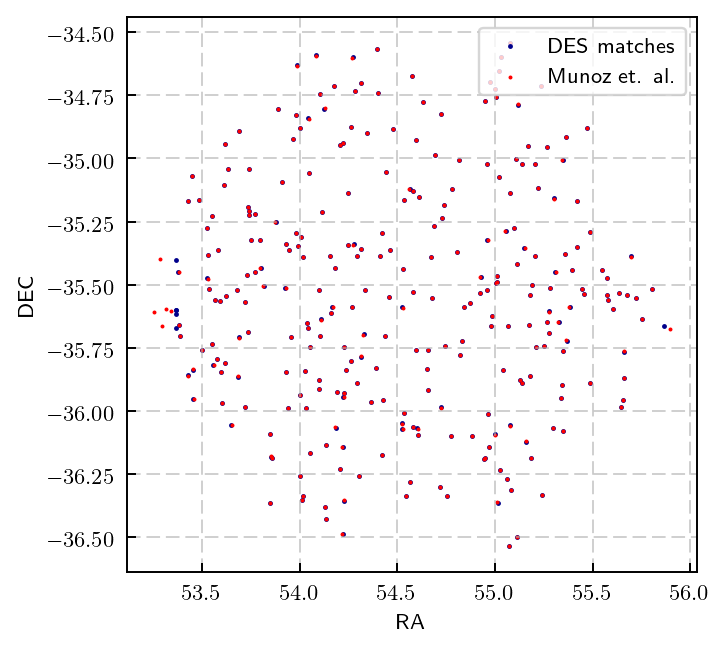

In [184]:
plot_pretty()
fig = plt.figure(figsize=(4.2,4.2))
plt.scatter(RA_m, DEC_m, c='darkblue', s=1.0,  label='DES matches')
plt.scatter(RA_f, DEC_f, c='red', s=0.4, label='Munoz et. al.')
plt.xlabel('RA'); plt.ylabel('DEC')
plt.grid(ls='--', alpha=0.6)
#plt.xlim(53,56.5)
plt.legend(frameon=True, loc='upper right', fontsize=9)
plt.show()

#### Additional cuts

Before selecting a region $\sim 15' \times 10'$ that seems to contain a pretty high number of UDGs, we want to perform one more selection cut. 

In order to keep only the brightest of them, we impose the following cut:

\begin{equation}
\mbox{MU_MEAN_G} < 25.5 \,\,\, \mbox{mag/arcsec}^2 \quad or \quad \mbox{MU_MAX_G} < 23.5 \,\,\,\mbox{mag/arcsec}^2
\end{equation}

Here for $\mbox{MU_MAX_G}$ I use actually the $\mbox{MU_MAX_MODEL_G}$.

In [185]:
bright_cut = ((MU_MEAN_G_m < 25.5)|(MU_MAX_G_MODEL_m <23.5))
#==============================================================

#Apply the bright cut now
# =========================================================
# =========================================================

# RA and DEC 
RA_b = RA_m[bright_cut]
DEC_b = DEC_m[bright_cut]

# Coadd_id 
COADD_b = COADD_m[bright_cut]

#Auto magnitudes
MAG_AUTO_G_b = MAG_AUTO_G_m[bright_cut] 
MAG_AUTO_R_b = MAG_AUTO_R_m[bright_cut] 
MAG_AUTO_I_b = MAG_AUTO_I_m[bright_cut] 

#Flux radii(pixels)
FLUX_RADIUS_G_b = FLUX_RADIUS_G_m[bright_cut]
FLUX_RADIUS_R_b = FLUX_RADIUS_R_m[bright_cut]
FLUX_RADIUS_I_b = FLUX_RADIUS_I_m[bright_cut]

# Kron radius
KRON_RAD_b = KRON_RAD_m[bright_cut]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_b = MU_EFF_G_m[bright_cut]
MU_EFF_R_b = MU_EFF_R_m[bright_cut]
MU_EFF_I_b = MU_EFF_I_m[bright_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_b = MU_MAX_G_m[bright_cut]
MU_MAX_R_b = MU_MAX_R_m[bright_cut]
MU_MAX_I_b = MU_MAX_I_m[bright_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_MODEL_b = MU_MAX_G_MODEL_m[bright_cut]
MU_MAX_R_MODEL_b = MU_MAX_R_MODEL_m[bright_cut]
MU_MAX_I_MODEL_b = MU_MAX_I_MODEL_m[bright_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_b = MU_MEAN_G_m[bright_cut]
MU_MEAN_R_b = MU_MEAN_R_m[bright_cut]
MU_MEAN_I_b = MU_MEAN_I_m[bright_cut]


print(len(RA_b))


159


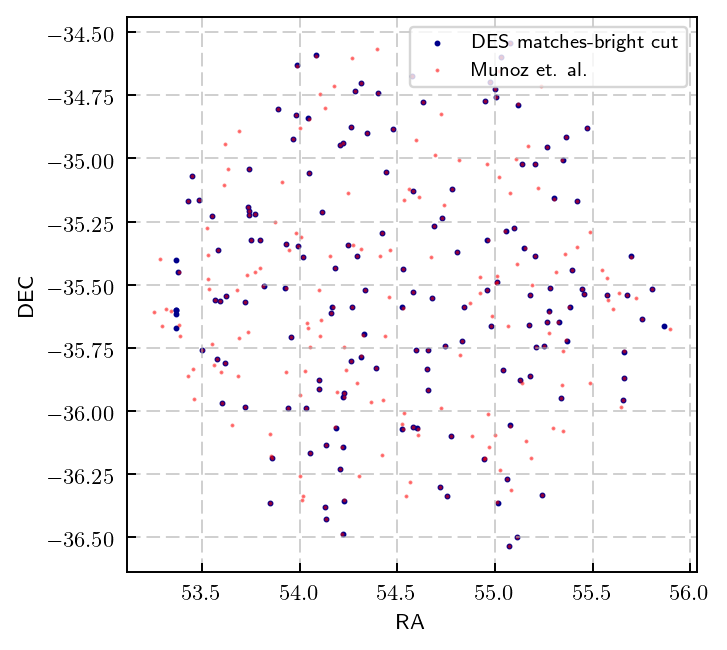

In [186]:
plot_pretty()
fig = plt.figure(figsize=(4.2,4.2))
plt.scatter(RA_b, DEC_b, c='darkblue', s=2.0,  label='DES matches-bright cut')
plt.scatter(RA_f, DEC_f, c='red', s=0.4, alpha=0.5,label='Munoz et. al.')
plt.xlabel('RA'); plt.ylabel('DEC')
plt.grid(ls='--', alpha=0.6)
#plt.xlim(53,56.5)
plt.legend(frameon=True, loc='upper right', fontsize=8)
plt.show()

Now I will select a region $15' \times 10'$ with a relatively high number of UDG galaxies.

Now $15' = 0.25^o$ and $10' = 0.166^o$.

I select the region:

\begin{equation}
53.667 < RA < 53.833 \\
-35.375 < DEC < -35.125 
\end{equation}


Which corresponds to a $15' \times 10'$ region with the $15'$ side being in the vertical (DEC) direction.


In [187]:
# Define the cut 
coord_cut = (RA_b>53.667)&(RA_b< 53.833)&(DEC_b > -35.375)&(DEC_b < -35.125)
#=================================================================================
#=================================================================================
# APPLY THE CUT NOW


# RA and DEC 
RA_c = RA_b[coord_cut]
DEC_c = DEC_b[coord_cut]

# Coadd_id 
COADD_c = COADD_b[coord_cut]

#Auto magnitudes
MAG_AUTO_G_c = MAG_AUTO_G_b[coord_cut] 
MAG_AUTO_R_c = MAG_AUTO_R_b[coord_cut] 
MAG_AUTO_I_c = MAG_AUTO_I_b[coord_cut] 

#Flux radii(pixels)
FLUX_RADIUS_G_c = FLUX_RADIUS_G_b[coord_cut]
FLUX_RADIUS_R_c = FLUX_RADIUS_R_b[coord_cut]
FLUX_RADIUS_I_c = FLUX_RADIUS_I_b[coord_cut]

# Kron radius
KRON_RAD_c = KRON_RAD_b[coord_cut]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_c = MU_EFF_G_b[coord_cut]
MU_EFF_R_c = MU_EFF_R_b[coord_cut]
MU_EFF_I_c = MU_EFF_I_b[coord_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_c = MU_MAX_G_b[coord_cut]
MU_MAX_R_c = MU_MAX_R_b[coord_cut]
MU_MAX_I_c = MU_MAX_I_b[coord_cut]

#Peak surface brightness above background -MODEL[mag/asec^2]
MU_MAX_G_MODEL_c = MU_MAX_G_MODEL_b[coord_cut]
MU_MAX_R_MODEL_c = MU_MAX_R_MODEL_b[coord_cut]
MU_MAX_I_MODEL_c = MU_MAX_I_MODEL_b[coord_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_c = MU_MEAN_G_b[coord_cut]
MU_MEAN_R_c = MU_MEAN_R_b[coord_cut]
MU_MEAN_I_c = MU_MEAN_I_b[coord_cut]

print(len(RA_c))

6


We have 6 candidates in that region. Let's plot the region, then inspect them visually to be sure that they are UDGs.

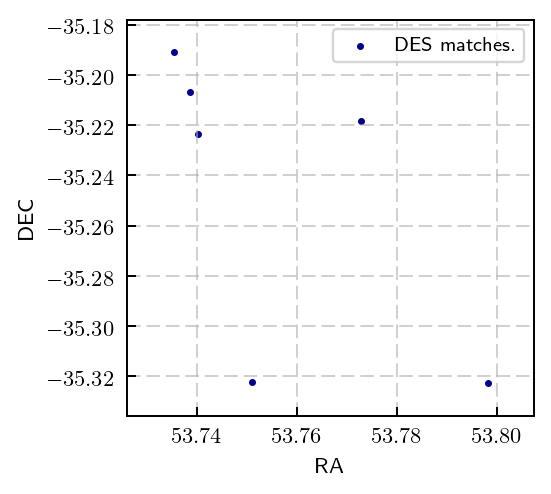

In [188]:
fig = plt.figure(figsize=(3.0,3.0))
plt.scatter(RA_c, DEC_c, c='darkblue', s=3.5, label='DES matches.')
plt.xlabel('RA'); plt.ylabel('DEC')
plt.grid(ls='--', alpha=0.6)
#plt.ylim(-35.77,-35.45)
plt.legend(frameon=True, loc='upper right', fontsize=8)
plt.show()

In [189]:
print(zip(RA_c,DEC_c))

[(53.735230999999999, -35.190817000000003), (53.738460000000003, -35.206657), (53.740074999999997, -35.223474000000003), (53.750962000000001, -35.322426), (53.772818999999998, -35.218350999999998), (53.798110999999999, -35.322929999999999)]


Now, after inspecting them visually, I disregard one of them 

In [190]:
#define final cut
fin_cut  = np.full((6), True, dtype=bool)
fin_cut[1] = False

In [191]:
# Apply final cut now 
# ===========================================================

# RA and DEC 
RA_fin = RA_c[fin_cut]
DEC_fin = DEC_c[fin_cut]

# Coadd_id 
COADD_fin = COADD_c[fin_cut]

#Auto magnitudes
MAG_AUTO_G_fin = MAG_AUTO_G_c[fin_cut] 
MAG_AUTO_R_fin = MAG_AUTO_R_c[fin_cut] 
MAG_AUTO_I_fin = MAG_AUTO_I_c[fin_cut] 

#Flux radii(pixels)
FLUX_RADIUS_G_fin = FLUX_RADIUS_G_c[fin_cut]
FLUX_RADIUS_R_fin = FLUX_RADIUS_R_c[fin_cut]
FLUX_RADIUS_I_fin = FLUX_RADIUS_I_c[fin_cut]

# Kron radius
KRON_RAD_fin = KRON_RAD_c[fin_cut]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_fin = MU_EFF_G_c[fin_cut]
MU_EFF_R_fin = MU_EFF_R_c[fin_cut]
MU_EFF_I_fin = MU_EFF_I_c[fin_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_fin = MU_MAX_G_c[fin_cut]
MU_MAX_R_fin = MU_MAX_R_c[fin_cut]
MU_MAX_I_fin = MU_MAX_I_c[fin_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_MODEL_fin = MU_MAX_G_MODEL_c[fin_cut]
MU_MAX_R_MODEL_fin = MU_MAX_R_MODEL_c[fin_cut]
MU_MAX_I_MODEL_fin = MU_MAX_I_MODEL_c[fin_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_fin = MU_MEAN_G_c[fin_cut]
MU_MEAN_R_fin = MU_MEAN_R_c[fin_cut]
MU_MEAN_I_fin = MU_MEAN_I_c[fin_cut]


In [194]:
from IPython.display import Image

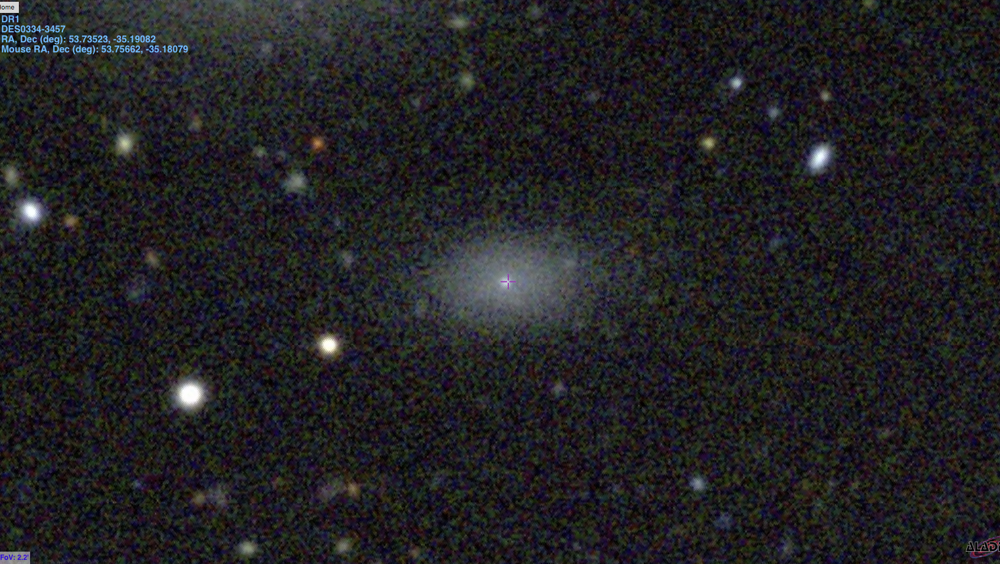

In [195]:
Image(filename='1.png')

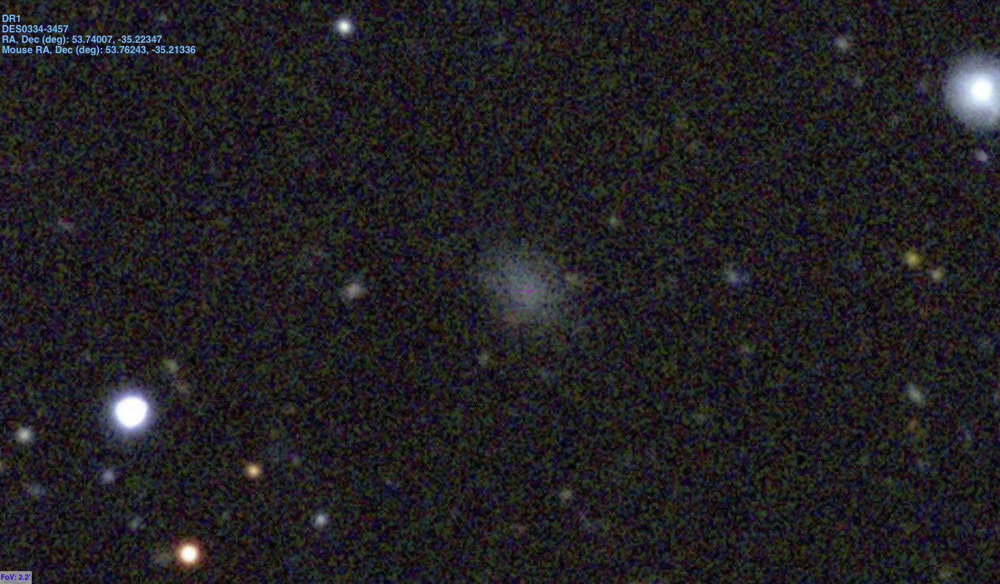

In [196]:
Image(filename='2.png')

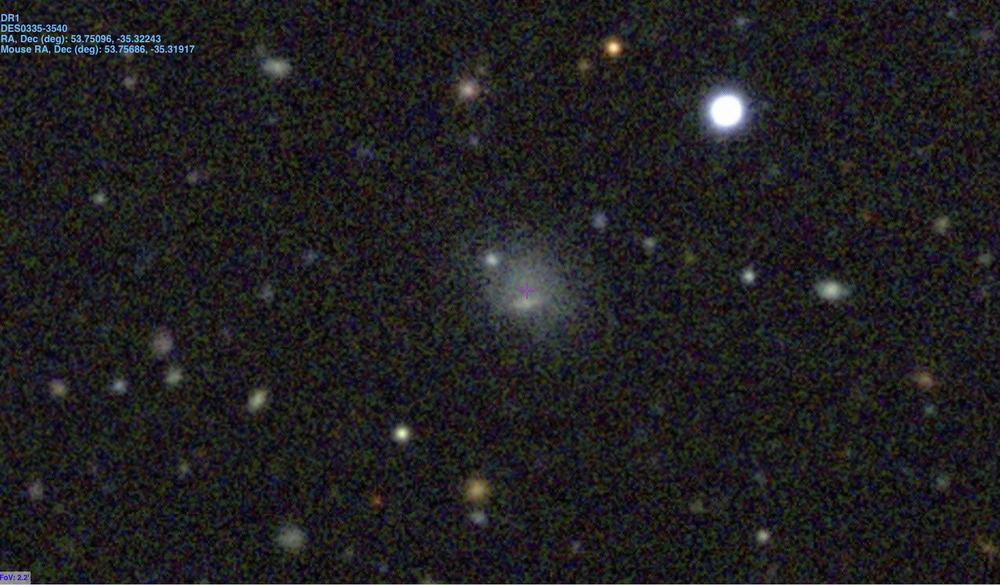

In [197]:
Image(filename='3.png')

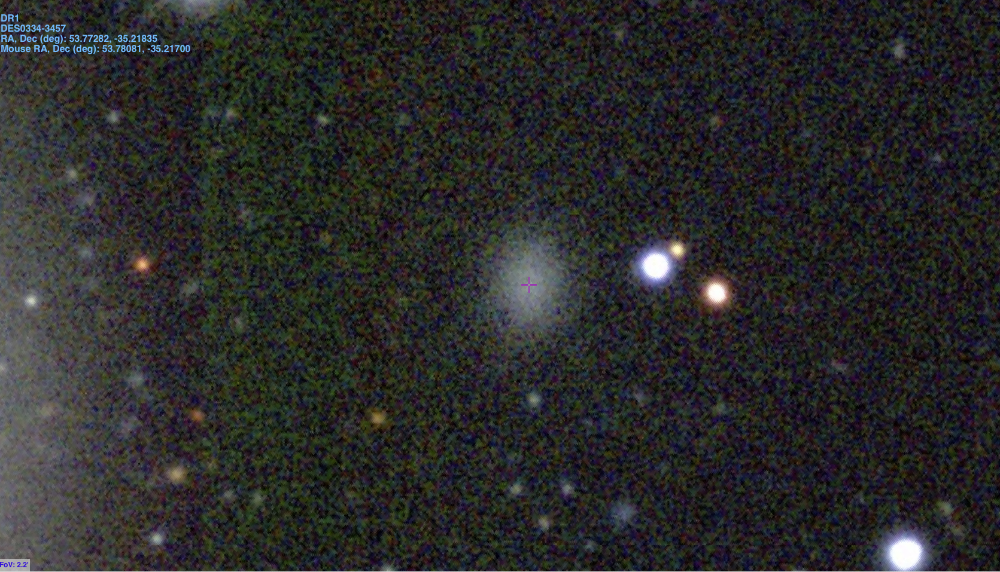

In [198]:
Image(filename='4.png')

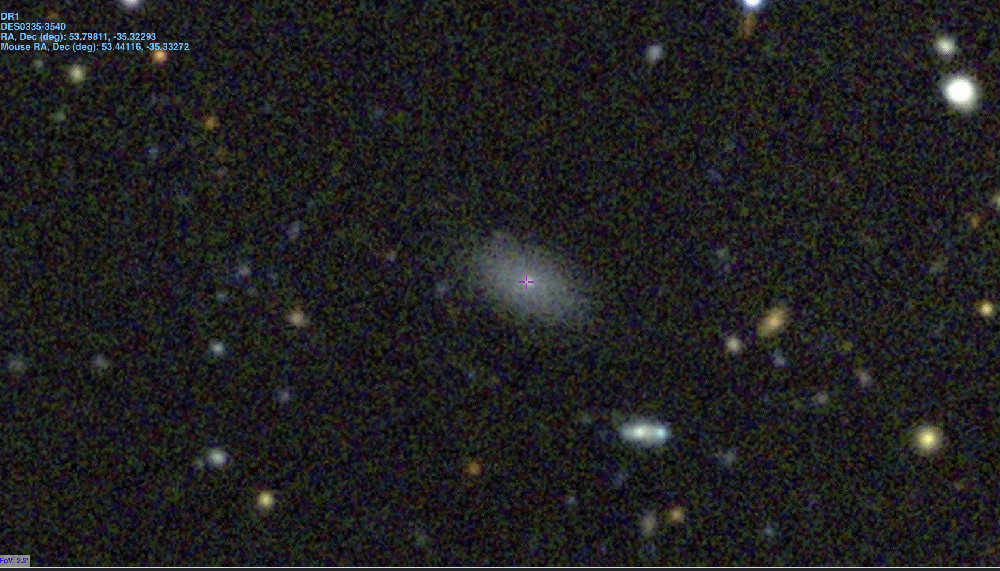

In [199]:
Image(filename='5.png')

##### Let's create a text file and store the properties of these galaxies.

In [201]:
np.savetxt('UDG_properties.dat', np.c_[COADD_fin, RA_fin, DEC_fin,
                                       MAG_AUTO_G_fin,MAG_AUTO_R_fin,MAG_AUTO_I_fin,
                                       FLUX_RADIUS_G_fin, FLUX_RADIUS_R_fin, FLUX_RADIUS_I_fin, KRON_RAD_fin,
                                       MU_EFF_G_fin, MU_EFF_R_fin, MU_EFF_I_fin,
                                       MU_MAX_G_fin, MU_MAX_R_fin, MU_MAX_I_fin,
                                       MU_MAX_G_MODEL_fin, MU_MAX_R_MODEL_fin, MU_MAX_I_MODEL_fin,
                                       MU_MEAN_G_fin, MU_MEAN_R_fin, MU_MEAN_I_fin])